In [1]:
import cv2
import math
import numpy as np
import matplotlib.pyplot as plt
from scipy.interpolate import griddata
from mpl_toolkits.axes_grid1 import AxesGrid

In [2]:
def reshapeComplex(waves):
    waves_shape = np.shape(waves)
    waves_1D = waves.flatten()
    real_1D = waves_1D[0::2]
    imag_1D = waves_1D[1::2]
    frame_num = int(waves_shape[0]/2)
    waves_real = np.reshape(real_1D, (frame_num, waves_shape[1], waves_shape[2]))
    waves_imag = np.reshape(imag_1D, (frame_num, waves_shape[1], waves_shape[2]))
    return waves_real + 1j*waves_imag

In [3]:
#read the gridded data using the current code. 
grid_data = np.load("grid_pos.npy")
grid_disp = reshapeComplex(grid_data)[0]

Text(0.5, 1.0, 'y displacement')

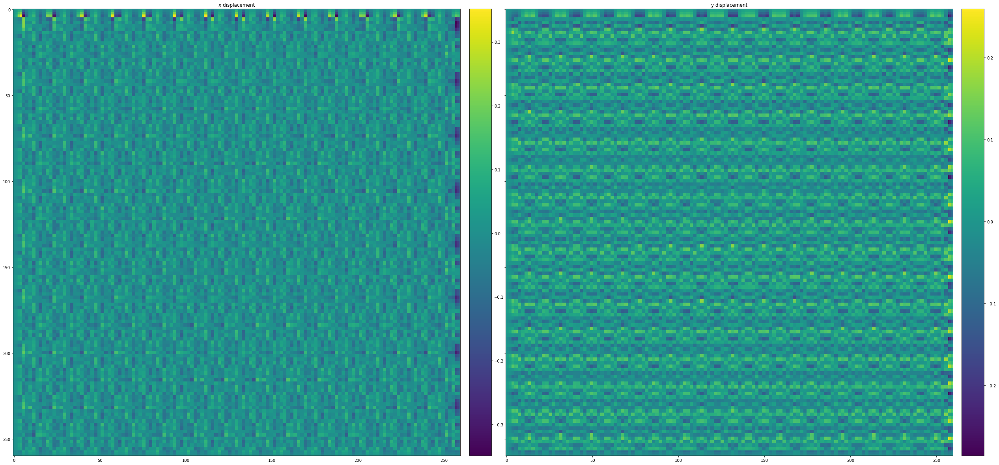

In [4]:
fig =plt.figure(1, figsize=(150, 75))
grid=AxesGrid(fig, 236, nrows_ncols=(1,2),
             axes_pad=0.5,
             share_all=False,
             cbar_location="right",
             cbar_mode="each",
             cbar_size="5%",
             cbar_pad="2%")
im=grid[0].imshow(np.real(grid_disp)[150:410,150:410], cmap=plt.cm.viridis)
grid.cbar_axes[0].colorbar(im)
grid[0].set_title("x displacement")
im=grid[1].imshow(np.imag(grid_disp)[150:410,150:410], cmap=plt.cm.viridis)
grid.cbar_axes[1].colorbar(im)
grid[1].set_title("y displacement")

In [5]:
#read the object function
obj = np.load('obj.npy')
obj = obj[0,:,:]+1j*obj[1,:,:]
#read the position data
pos_inc = np.load("disp_value.npy")[0]
pos_init = np.load("scan_pos.npy")[0]
# data coordinates and values
x_pos = pos_init[:, 0]
y_pos = pos_init[:, 1]

In [6]:
# target grid to interpolate to
X, Y = np.meshgrid(np.arange(0, obj.shape[1]), np.arange(0, obj.shape[0]))
# interpolate
dispy = griddata((x_pos,y_pos),pos_inc[:,1],(X,Y), method='linear', fill_value= 0.0)
dispy = np.reshape(dispy, obj.shape)
dispx = griddata((x_pos,y_pos),pos_inc[:,0],(X,Y), method='linear', fill_value= 0.0)
dispx = np.reshape(dispx, obj.shape)

Text(0.5, 1.0, 'y displacement')

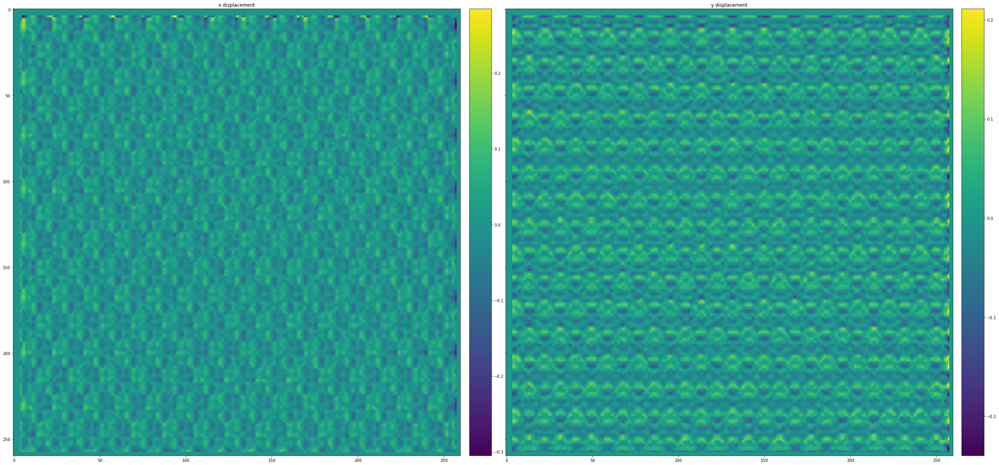

In [7]:
fig =plt.figure(1, figsize=(150, 75))
grid=AxesGrid(fig, 236, nrows_ncols=(1,2),
             axes_pad=0.5,
             share_all=False,
             cbar_location="right",
             cbar_mode="each",
             cbar_size="5%",
             cbar_pad="2%")
im=grid[0].imshow(dispx[150:410,150:410], cmap=plt.cm.viridis)
grid.cbar_axes[0].colorbar(im)
grid[0].set_title("x displacement")
im=grid[1].imshow(dispy[150:410,150:410], cmap=plt.cm.viridis)
grid.cbar_axes[1].colorbar(im)
grid[1].set_title("y displacement")

Text(0.5, 1.0, 'object FFT')

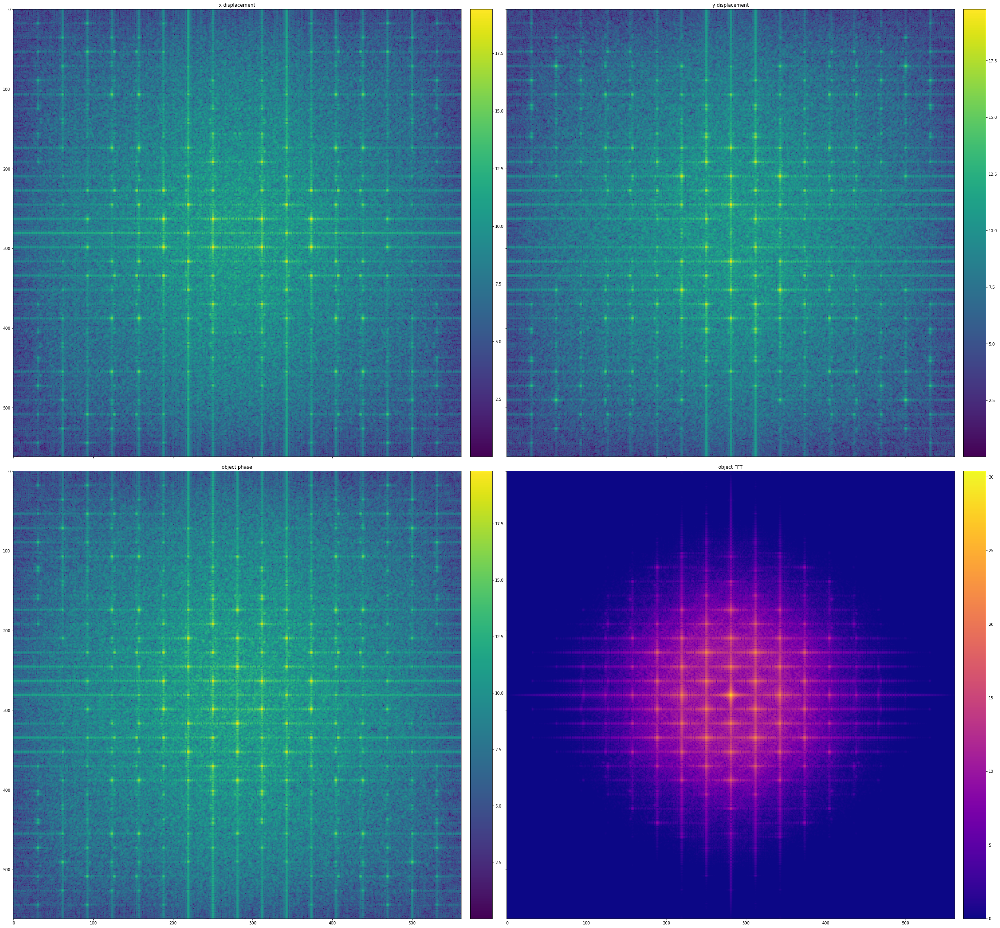

In [8]:
disp = dispx + 1j*dispy
window2d = np.sqrt(np.outer(np.abs(np.hanning(dispx.shape[0])),np.abs(np.hanning(dispx.shape[1]))))
fig =plt.figure(1, figsize=(150, 150))
grid=AxesGrid(fig, 236, nrows_ncols=(2,2),
             axes_pad=0.5,
             share_all=False,
             cbar_location="right",
             cbar_mode="each",
             cbar_size="5%",
             cbar_pad="2%")
im=grid[0].imshow(np.log(np.square(np.abs(np.fft.fftshift(np.fft.fft2(dispx*window2d))))*1000+1.0), cmap=plt.cm.viridis)
grid.cbar_axes[0].colorbar(im)
grid[0].set_title("x displacement")
im=grid[1].imshow(np.log(np.square(np.abs(np.fft.fftshift(np.fft.fft2(dispy*window2d))))*1000+1.0), cmap=plt.cm.viridis)
grid.cbar_axes[1].colorbar(im)
grid[1].set_title("y displacement")
im=grid[2].imshow(np.log(np.square(np.abs(np.fft.fftshift(np.fft.fft2(disp*window2d))))*1000+1.0), cmap=plt.cm.viridis)
grid.cbar_axes[2].colorbar(im)
grid[2].set_title("object phase")
im=grid[3].imshow(np.log(np.square(np.abs(np.fft.fftshift(np.fft.fft2(obj*window2d))))*1000+1.0), cmap=plt.cm.plasma)
grid.cbar_axes[3].colorbar(im)
grid[3].set_title("object FFT")

In [9]:
#The filter function consist of a Gaussian function and a sinc function.
def FilterWeight(r, blurring):
    inner_sigma = 5
    weight = np.exp(-0.5*r*r/(inner_sigma*inner_sigma))
    return weight

In [10]:
X, Y = np.meshgrid(np.arange(0, dispx.shape[1]), np.arange(0, dispx.shape[0]))
Radius = np.sqrt((X- dispx.shape[1]/2)*(X- dispx.shape[1]/2) + (Y- dispx.shape[0]/2)*(Y- dispx.shape[0]/2))
filter2d = FilterWeight(Radius, 5)
#filter the displacemnt field.
FFTImage = np.fft.fftshift(np.fft.fft2(disp))
disp_filter = np.fft.ifft2(np.fft.ifftshift(filter2d*FFTImage))

Text(0.5, 1.0, 'y displacement')

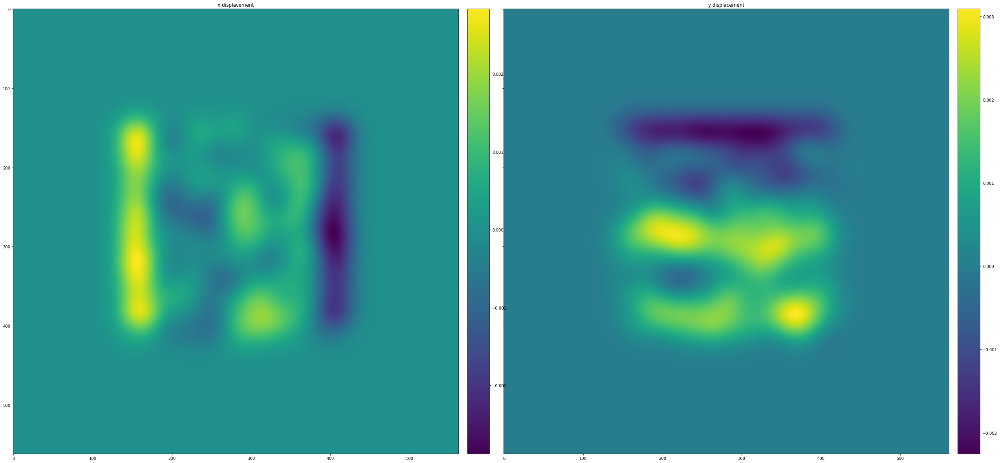

In [11]:
fig =plt.figure(1, figsize=(150, 75))
grid=AxesGrid(fig, 236, nrows_ncols=(1,2),
             axes_pad=0.5,
             share_all=False,
             cbar_location="right",
             cbar_mode="each",
             cbar_size="5%",
             cbar_pad="2%")
im=grid[0].imshow(np.real(disp_filter), cmap=plt.cm.viridis)
grid.cbar_axes[0].colorbar(im)
grid[0].set_title("x displacement")
im=grid[1].imshow(np.imag(disp_filter), cmap=plt.cm.viridis)
grid.cbar_axes[1].colorbar(im)
grid[1].set_title("y displacement")

Text(0.5, 1.0, 'y displacement')

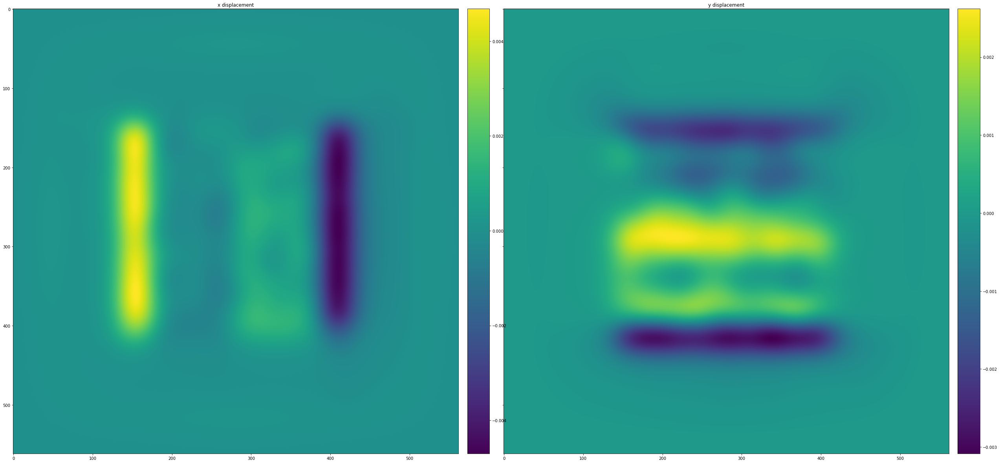

In [12]:
#load the filtered displacement.
grid_dataf = np.load("grid_posf.npy")
grid_dispf = reshapeComplex(grid_dataf)[0]
#show the filtered data
fig =plt.figure(1, figsize=(150, 75))
grid=AxesGrid(fig, 236, nrows_ncols=(1,2),
             axes_pad=0.5,
             share_all=False,
             cbar_location="right",
             cbar_mode="each",
             cbar_size="5%",
             cbar_pad="2%")
im=grid[0].imshow(np.real(grid_dispf), cmap=plt.cm.viridis)
grid.cbar_axes[0].colorbar(im)
grid[0].set_title("x displacement")
im=grid[1].imshow(np.imag(grid_dispf), cmap=plt.cm.viridis)
grid.cbar_axes[1].colorbar(im)
grid[1].set_title("y displacement")

In [13]:
#read the object function
obj = np.load('obj.npy')
obj = obj[0,:,:]+1j*obj[1,:,:]
#read the position data
pos_inc = np.load("disp_valuef.npy")[0]
pos_init = np.load("scan_pos.npy")[0]
# data coordinates and values
x_pos = pos_init[:, 0]
y_pos = pos_init[:, 1]

In [14]:
# target grid to interpolate to
X, Y = np.meshgrid(np.arange(0, obj.shape[1]), np.arange(0, obj.shape[0]))
# interpolate
dispy = griddata((x_pos,y_pos),pos_inc[:,1],(X,Y), method='linear', fill_value= 0.0)
dispy = np.reshape(dispy, obj.shape)
dispx = griddata((x_pos,y_pos),pos_inc[:,0],(X,Y), method='linear', fill_value= 0.0)
dispx = np.reshape(dispx, obj.shape)

Text(0.5, 1.0, 'y displacement')

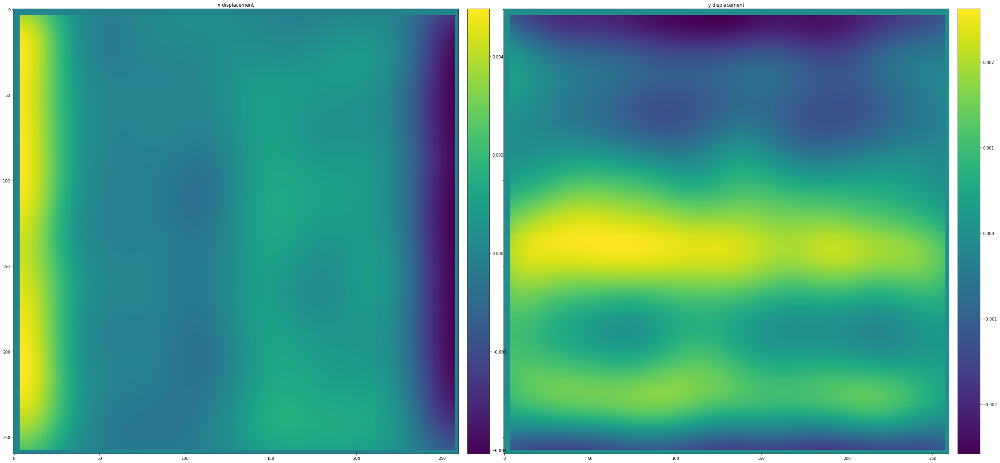

In [16]:
fig =plt.figure(1, figsize=(150, 75))
grid=AxesGrid(fig, 236, nrows_ncols=(1,2),
             axes_pad=0.5,
             share_all=False,
             cbar_location="right",
             cbar_mode="each",
             cbar_size="5%",
             cbar_pad="2%")
im=grid[0].imshow(dispx[150:410,150:410], cmap=plt.cm.viridis)
grid.cbar_axes[0].colorbar(im)
grid[0].set_title("x displacement")
im=grid[1].imshow(dispy[150:410,150:410], cmap=plt.cm.viridis)
grid.cbar_axes[1].colorbar(im)
grid[1].set_title("y displacement")